# Strange Attractors
2. a) { I think the question is just about writing the code? }

In [37]:
# k is the size of the extremely small time step
sig = 10
b = 8/3
r = 28
k = 0.01

# defining the differential equations
dxdt(x, y, z) = sig*(y-x)
dydt(x, y, z) = r*x - y - x*z
dzdt(x, y, z) = x*y - b*z

# defining the RK4 method
def rk4(x, y, z):
    k1x, k1y, k1z = k*dxdt(x, y, z), k*dydt(x, y, z), k*dzdt(x, y, z)
    
    k2x = k*dxdt(x+k1x/2, y+k1y/2, z+k1z/2)
    k2y = k*dydt(x+k1x/2, y+k1y/2, z+k1z/2) 
    k2z = k*dzdt(x+k1x/2, y+k1y/2, z+k1z/2)
    
    k3x = k*dxdt(x+k2x/2, y+k2y/2, z+k2z/2) 
    k3y = k*dydt(x+k2x/2, y+k2y/2, z+k2z/2) 
    k3z = k*dzdt(x+k2x/2, y+k2y/2, z+k2z/2)
    
    k4x, k4y, k4z = k*dxdt(x+k3x, y+k3y, z+k3z), k*dydt(x+k3x, y+k3y, z+k3z), k*dzdt(x+k3x, y+k3y, z+k3z)
    x_new = x + 1/6 * (k1x + 2*k2x + 2*k3x + k4x)
    y_new = y + 1/6 * (k1y + 2*k2y + 2*k3y + k4y)
    z_new = z + 1/6 * (k1z + 2*k2z + 2*k3z + k4z)
    return x_new, y_new, z_new


b) The code and plots for the approximations for x(t), y(t) and z(t) for every second r value from 20 to 30. 

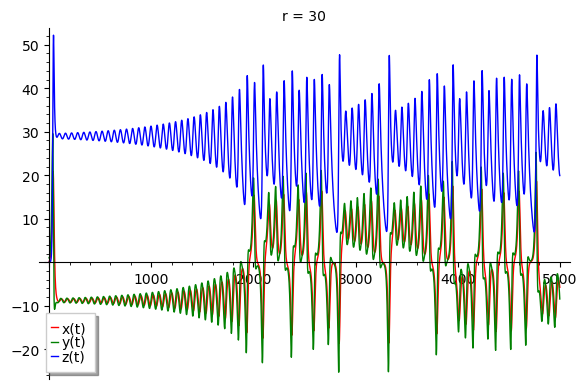

In [191]:
# the code for creating separate outputs for x(t), y(t) and z(t), respectively
# each sublist represents the numerical approximations for x(t), y(t) and z(t) respectively
sols = [[0], [1], [0]]
for t in range(5000):
    x, y, z = sols[0][t], sols[1][t], sols[2][t]
    x_new, y_new, z_new = rk4(x, y, z)
    sols[0].append(x_new)
    sols[1].append(y_new)
    sols[2].append(z_new)

plotting the functions x(t), y(t), and z(t) 
p = list_plot(sols[0], plotjoined = True, color = "red", legend_label = "x(t)", title = "r = " + str(r))
p += list_plot(sols[1], plotjoined = True, color = "green", legend_label = "y(t)")
p += list_plot(sols[2], plotjoined = True, color = "blue", legend_label = "z(t)")
p
# I created each of the graphs by reassigning r in line 6 of cell 1

In [ ]:
sols = [[0], [1], [0]]
for t in range(5000):
    x, y, z = sols[0][t], sols[1][t], sols[2][t]
    x_new, y_new, z_new = rk4(x, y, z)
    sols[0].append(x_new)
    sols[1].append(y_new)
    sols[2].append(z_new)

plotting the functions x(t), y(t), and z(t) 
p = list_plot(sols[0], plotjoined = True, color = "red", legend_label = "x(t)", title = "r = " + str(r))
p += list_plot(sols[1], plotjoined = True, color = "green", legend_label = "y(t)")
p += list_plot(sols[2], plotjoined = True, color = "blue", legend_label = "z(t)")
p

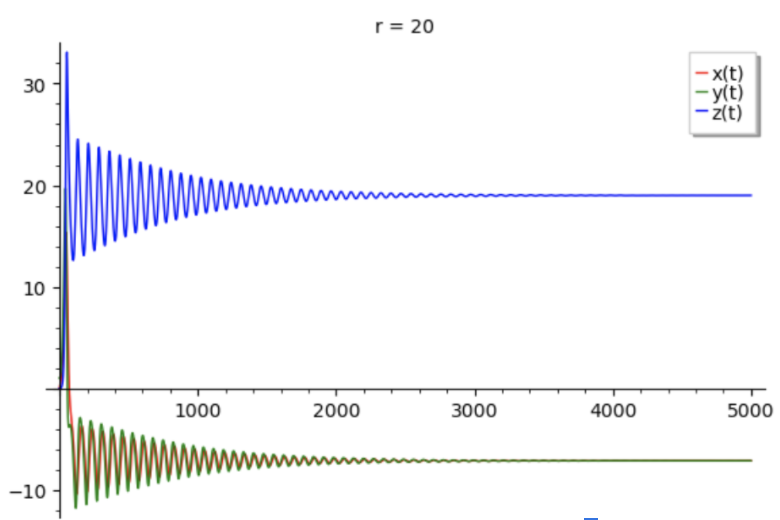


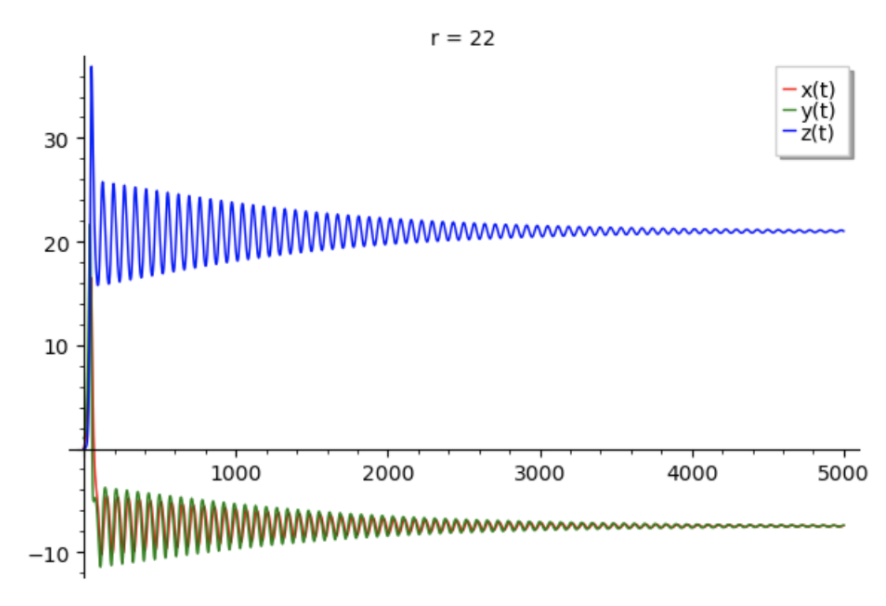

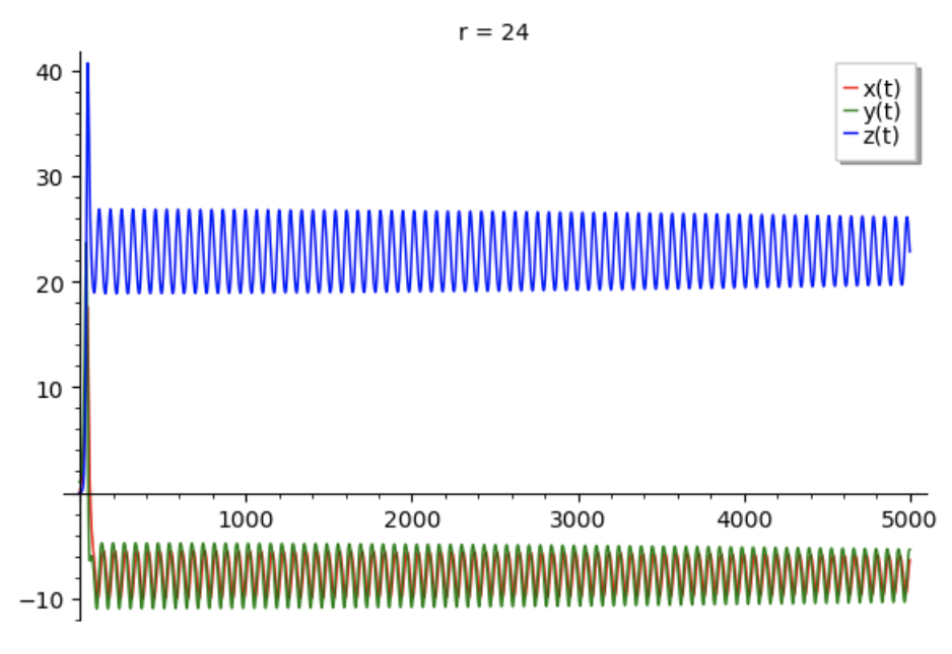

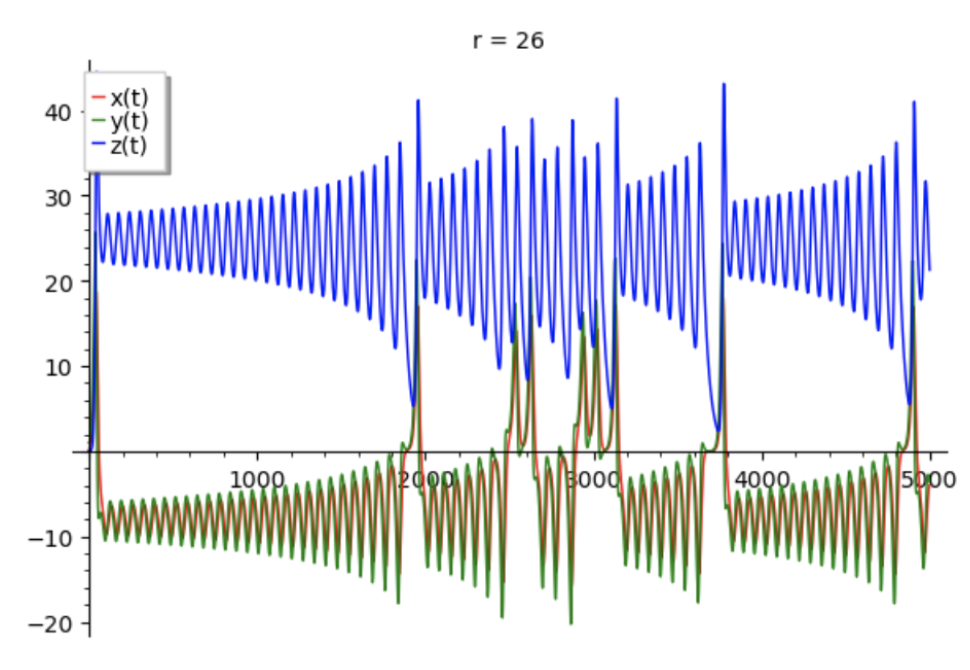

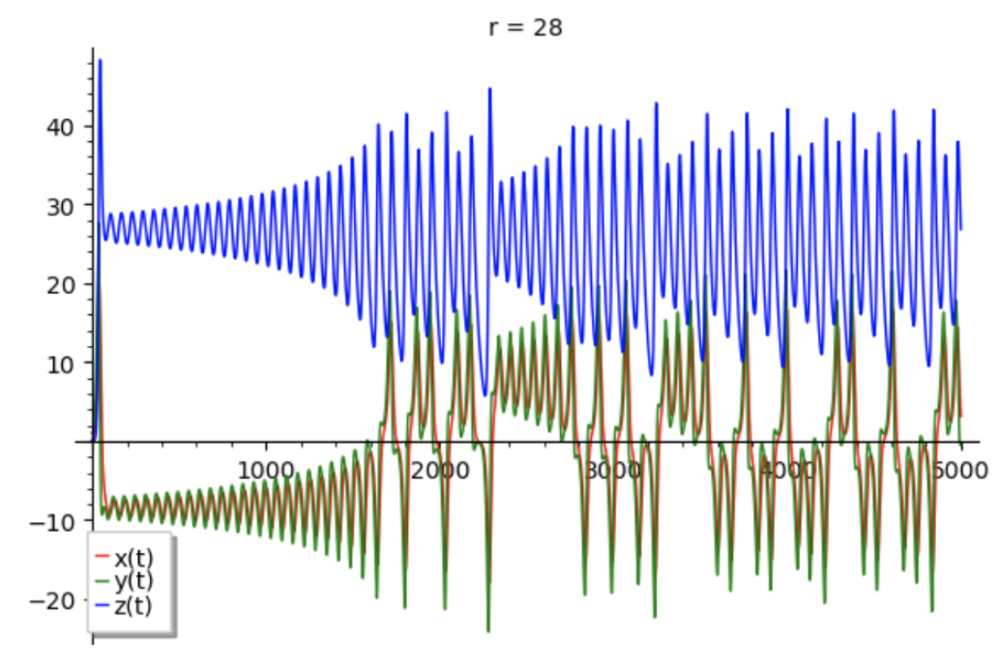

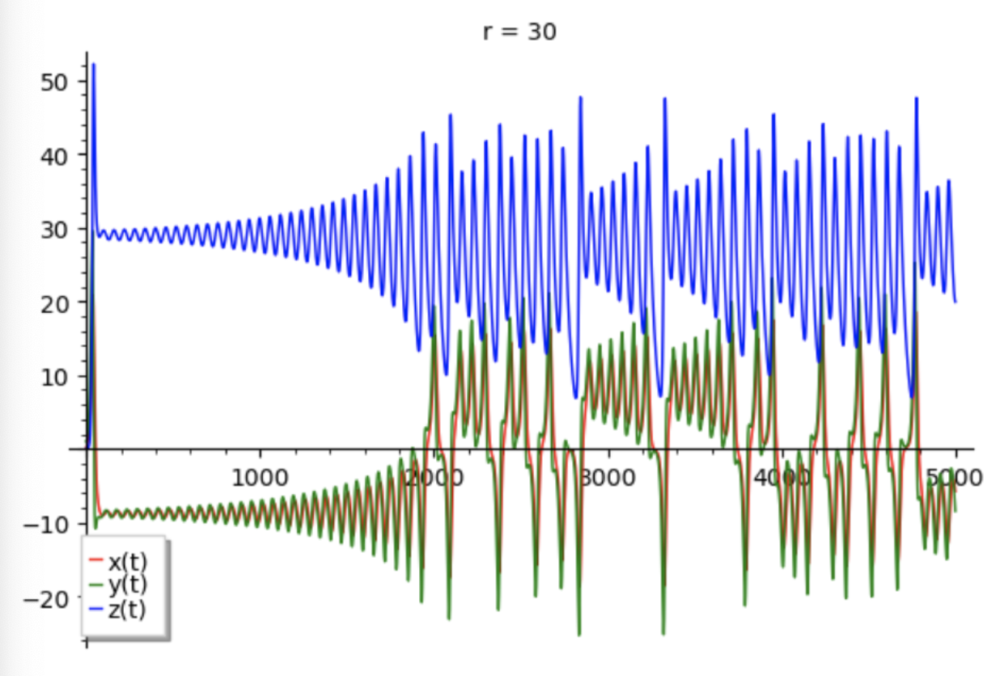

For r = 20, the oscillations seem to die out very quickly after approx. 3000 steps. Increasing r to 22 means the oscillations are less extreme but persist for longer and only die out after approx. 5000 steps. Setting r = 22 means the system is cyclic and maintains its path forever, evident by the fact that the oscillations never seem to die out or deviate from their current path, or it is dying out extremely slowly.  
Starting at r = 26, the circular path the system seems to follow starts out with a tiny circle which spirals outwards and gets larger, until it reaches a certain point at which it leaves its current path and follows a totally new circle and creating seemingly concentrix/spiralling figure-8s. Most of the time is spent in the first circle with only occasional loops in the new circle. From r = 28, after approx. 1600 steps, the point moves to the new circle and spends a lot of time looping around that path in a much wider path (a relatively big figure-8 compared to the size of the initial loops), and r = 30 follows a similar pattern.

(c) and (d): Creating a parametric plot for the point and its x, y, and z coordinates, for both initial conditions (0, 1, 0) and (0, 1.0000001, 0). Since we don't have explicit functions for x(t), y(t) and z(t), just a set of points, I stored the points in a list and created a line_plot.

In [ ]:
# creating the list of sequential points with initial condition (0, 1, 0)
from sage.plot.plot3d.shapes2 import Line
rs3d = [(0, 1, 0)]
for t in range(10000):
    x, y, z = rs3d[t]
    rs3d.append(rk4(x, y, z))

In [36]:
# creating the list of points for the initial condition (0, 1.0000001, 0) 
rs3d_nudged = [(0, 1.0000001, 0)]
for t in range(10000):
    x, y, z = rs3d_nudged[t]
    rs3d_nudged.append(rk4(x, y, z))

# creating the parametric plots for each of the points
p1 = Line(rs3d, thickness = 3, color = "black")
p2 = Line(rs3d_nudged, thickness = 3, color = "blue")
show(p1)
show(p2)

Graphics3d Object

Graphics3d Object

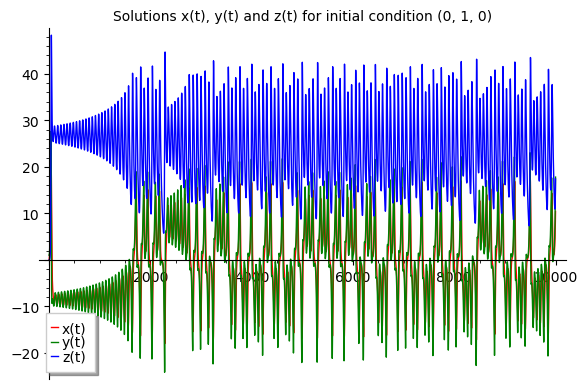

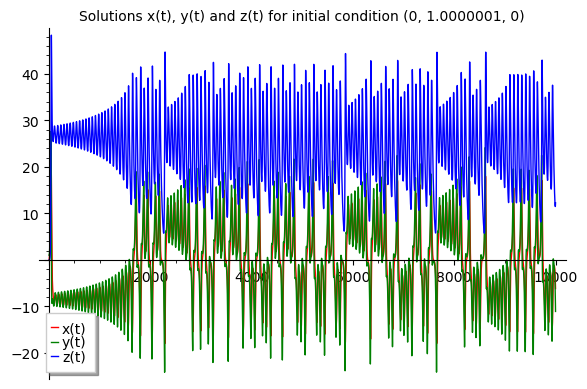

In [38]:
sols1 = [[0], [1], [0]]
for t in range(10000):
    x, y, z = sols1[0][t], sols1[1][t], sols1[2][t]
    x_new, y_new, z_new = rk4(x, y, z)
    sols1[0].append(x_new)
    sols1[1].append(y_new)
    sols1[2].append(z_new)
    
sols2 = [[0], [1.0000001], [0]]
for t in range(10000):
    x, y, z = sols2[0][t], sols2[1][t], sols2[2][t]
    x_new, y_new, z_new = rk4(x, y, z)
    sols2[0].append(x_new)
    sols2[1].append(y_new)
    sols2[2].append(z_new)

# plotting the functions x(t), y(t), and z(t) for (0, 1, 0)
p1 = list_plot(sols1[0], plotjoined = True, color = "red", legend_label = "x(t)", title = "Solutions x(t), y(t) and z(t) for initial condition (0, 1, 0)")
p1 += list_plot(sols1[1], plotjoined = True, color = "green", legend_label = "y(t)")
p1 += list_plot(sols1[2], plotjoined = True, color = "blue", legend_label = "z(t)")
show(p1)

# plotting the functions x(t), y(t), and z(t) for (0, 1.0000001, 0)
p2 = list_plot(sols2[0], plotjoined = True, color = "red", legend_label = "x(t)", title = "Solutions x(t), y(t) and z(t) for initial condition (0, 1.0000001, 0)")
p2 += list_plot(sols2[1], plotjoined = True, color = "green", legend_label = "y(t)")
p2 += list_plot(sols2[2], plotjoined = True, color = "blue", legend_label = "z(t)")
show(p2)


The solution functions seem to oscillate differently for the two initial conditions. For the 2nd one, the z-value peaks have a higher amplitude and are more frequent. Based on the x(t) and y(t) plots, it seems that the point switches between the two spirals in its path more frequently in the first condition than in the second, i.e. in the second graph, the point seems to spend more time in each spiral before changing than it does in the first graph.

In [206]:
# showing the difference in function values at each time step, using a logarithmic scale plot
# defining a function that finds the distance between two points
def dist(t1, t2):
    return(sqrt((t1[0] - t2[0])^2 + (t1[1] - t2[1])^2 + (t1[2] - t2[2])^2))

distances = [dist(rs3d[t], rs3d_nudged[t]) for t in range(10000)]

Creating a logarithmic plot for the distance between the two graphs at each time step.

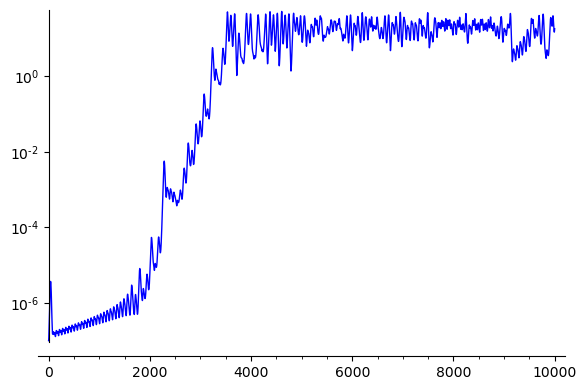

In [217]:
list_plot(distances, plotjoined = True, scale = "semilogy")

This graph shows that up until approx. 3500 steps, the distances between the two graphs are of a magnitude < $10^0$ and after that, it oscillates around the $10^1$ magnitude difference for the remaining time steps.

# PDE Solver - Laplace Equation
a) $$u_{1, j} = 0$$ $$u_{N, j} = 0$$ $$u_{i, 1} = 0$$ $$u_{i, N} = sin(2\pi{i})$$


b) 5-point stencil:

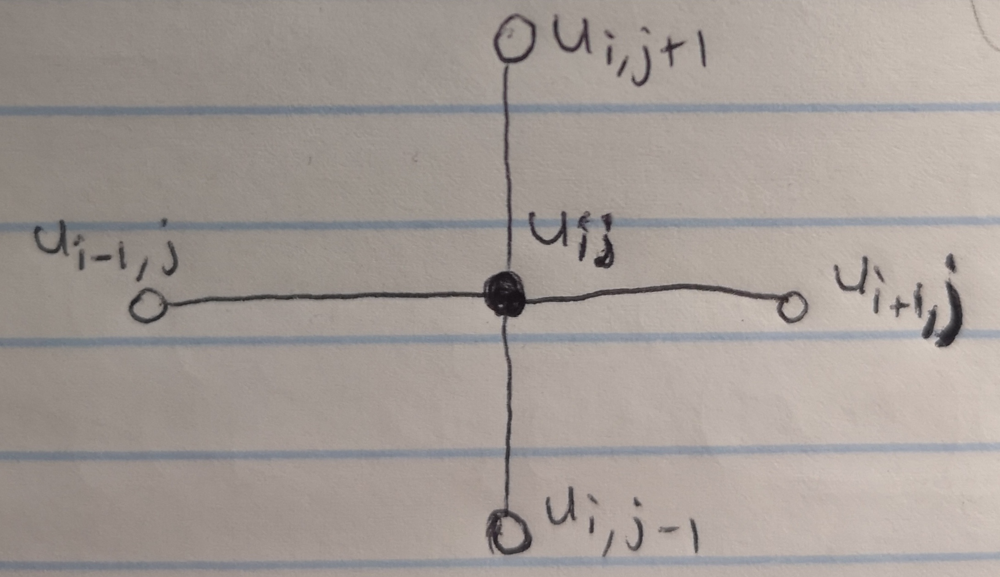

From the stencil, we see that we need to use the subsequent and previous points, i+1 & i-1 and j+1 & j-1 respectively, to calculate the 2nd derivative with respect to x and y at the point $u_{i,j}$. For this, we need two 2nd order central difference approximations, one for x and one for y.

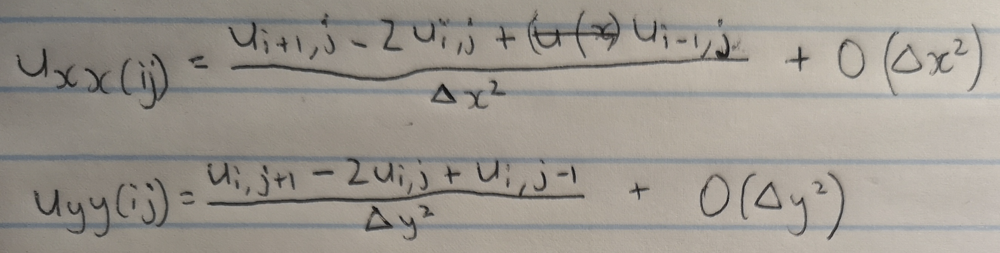

Because we are taking the second difference of both the x and y values at the point $u_{i, j}$, i.e. we are finding the slope on both sides of the point (in both directions) and finding the change in the slope per change in distance, the Taylor series approximation truncates the terms after the $x^2$ term. Since the manipulation of the Taylor series was done by adding the two series for $u_{i-1, j}$ and $u_{i+1, j}$ for $u_{xx}$, and $u_{i, j-1}$ and $u_{i, j+1}$ for $u_{yy}$, in both cases, the odd powers of x and y cancelled each other out meaning only the even powers, i.e. $\delta{x}^2$ and $\delta{x}^4$, etc. remained. Since we are trying to solve for the 2nd derivative, divide both sides by $\delta{x}^2$ which leaves a $\delta{x}^2$ in the numerator which gets truncated, meaning our errors for x and y are $O(\Delta{x}^2)$ and $O(\Delta{y}^2)$, respectively.

c) Substituting the finite difference approximations into Laplace's equation, and assuming that $\Delta{x} = \Delta{y}$ and setting it equal to $d$

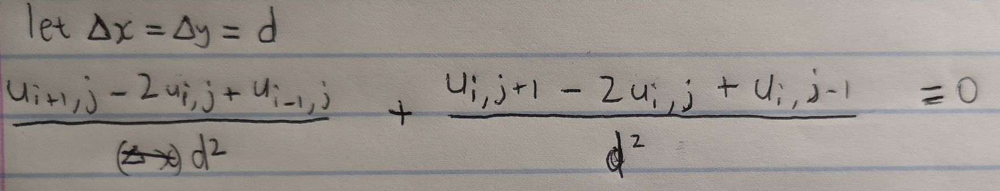

d) Defining the equations for $u_{22}, u_{32}, u_{23}, u_{33}$, putting them into a vector and defining the matrix product for the discretised system.

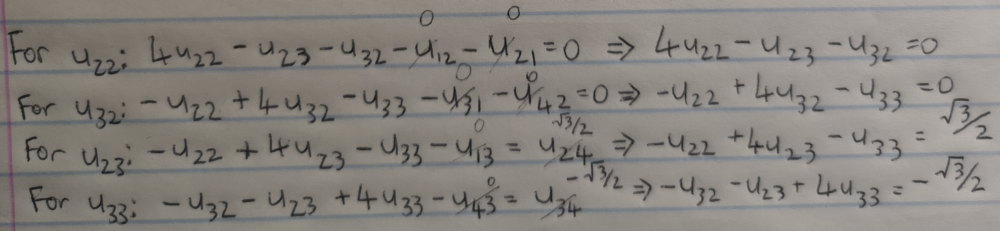

In [39]:
# creating the matrix product rom the set of equations
LapMat = matrix([[4, -1, -1, 0], [-1, 4, 0, -1], [-1, 0, 4, -1], [0, -1, -1, 4]])
ds = matrix([0, 0, sqrt(3)/2, -sqrt(3)/2]).transpose()
u_22, u_32, u_23, u_33 = var("u_22, u_32, u_23, u_33")
us = matrix([u_22, u_32, u_23, u_33]).transpose()
show(LapMat,us, "=", ds)


[ 4 -1 -1  0]
[-1  4  0 -1]
[-1  0  4 -1]
[ 0 -1 -1  4] [u_22]
[u_32]
[u_23]
[u_33] '=' [           0]
[           0]
[ 1/2*sqrt(3)]
[-1/2*sqrt(3)]

e) Using Sage to find the temperatures at each of the 4 points.

In [41]:
solution = LapMat.solve_right(ds)
show(us, "=", solution)

[u_22]
[u_32]
[u_23]
[u_33] '=' [ 1/48*sqrt(3)]
[-1/48*sqrt(3)]
[ 5/48*sqrt(3)]
[-5/48*sqrt(3)]

## Reference:
Finite Difference Method for the Solution of Laplace Equation, retrieved from https://www.andrew.cmu.edu/course/24-681/handouts/lectures/fdm_for_laplace_equation.pdf